In [1]:
from sat_benchmark import run_benchmark_sample, Trials, CompileType, backend
from sat_database import ThreeSatDB, ThreeSat
from qiskit_ibm_runtime import Batch

import logging
logging.disable()

# XAG stuff
from tweedledum.bool_function_compiler import QuantumCircuitFunction
from sat import parameterized_3sat

sat_db = ThreeSatDB(db_name="random_3sat_problems.db")
sat_trials_db = Trials(db_name="3sat_trials.db")

In [13]:
# run benchmark

#BENCHMARK_COMPILE_TYPE = CompileType.XAG
BENCHMARK_COMPILE_TYPE = CompileType.CLASSICAL_FUNCTION

for n in range(8,11):
    for c in range(3, 10):
        with Batch(backend) as batch:
            for sat in sat_db.get(num_vars=n, num_clauses=c):

                sat.print_summary()          
                optimal_grover_iterations = sat.optimal_grover_iterations()

                if optimal_grover_iterations == 0:
                    continue
                
                classical_circ = QuantumCircuitFunction(parameterized_3sat, n, sat.expr)
                if BENCHMARK_COMPILE_TYPE is CompileType.XAG:
                    oracle = classical_circ.synthesize_quantum_circuit()
                else:
                    oracle = classical_circ.truth_table_synthesis()
                
                # Runs a circut for 1 iteration, 2 iterations, ..., up to optimal and stores them in db
                for grover_iterations in range(1, optimal_grover_iterations+1): 
                    if oracle is None:
                        # tweedledum failed, marked as failure
                        trial = Trial(
                            sat_instance=sat,
                            sat_id=sat_instance.sat_id,
                            compile_type=compile_type,
                            num_vars=sat_instance.num_vars,
                            num_clauses=sat_instance.num_clauses,
                            grover_iterations=grover_iterations,
                            job_id=None,
                            job_pub_idx=0,
                            simulation_counts=None
                        )
                        trial.mark_failure()
                        trials.save(trial)
                        continue
    
                    run_benchmark_sample(
                        trials=sat_trials_db,
                        sat_instance=sat,
                        compile_type=BENCHMARK_COMPILE_TYPE,
                        sat_oracle=oracle,
                        grover_iterations=grover_iterations,
                        shots=10**3,
                        include_existing_trials=False
                    )

--- 3SAT Instance Summary ---
Database ID (sat_id):     8501
Generation Seed:          2121166097
Number of Variables:      8
Number of Clauses:        3
Expression:               (~x8 V ~x3 V x4) ^ (x4 V ~x5 V ~x8) ^ (~x3 V ~x8 V ~x2)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             192
Percentage Solutions:     75.0000% (192/256)
Optimal Grover Iterations: 0
-----------------------------
--- 3SAT Instance Summary ---
Database ID (sat_id):     8502
Generation Seed:          751561745
Number of Variables:      8
Number of Clauses:        3
Expression:               (x2 V ~x7 V ~x6) ^ (x7 V ~x4 V x1) ^ (x2 V x6 V x4)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             80
Percentage Solutions:     31.2500% (80/256)
Optimal Grover Iterations: 1
-----------------------------
Running benchmark sample for 3SAT instance 8502
Looking for a satisfying assignment using 1 iterations
--- 3SAT Ins

In [20]:
import matplotlib.pyplot as plt
import numpy as np

def get_probability_data(trial_db, compile_type: CompileType):
    n_data = []
    clauses_data = []
    probability_data = []

    for num_vars in range(3, 11):
        for num_clauses in range(3, 10):
            grover_iterations = 1
            print(f"(num_vars, num_clauses) = ({num_vars}, {num_clauses})")
            trials = trial_db.get(num_vars=num_vars, num_clauses=num_clauses, grover_iterations=grover_iterations, compile_type=compile_type)

            if len(trials) == 0:
                print(f"Warning: no results for {num_vars} variables, complexity {num_clauses}; skipping")
                continue

            success_rates = np.zeros(len(trials))
            expected_success_rates = np.zeros(len(trials))

            for i, trial in enumerate(trials):
                success_rates[i] = trial.success_rate
                expected_success_rates[i] = trial.expected_success_rate
                print(f"Trial ID: {trial.trial_id}")
                trial.sat_instance.print_summary()
                print(f"{len(trial.sat_instance.solutions)} solutions: {trial.sat_instance.solutions}")
                print(f"Expected Success Rate: {expected_success_rates[i]}")
                print(f"Success Rate: {success_rates[i]}")

            n_data.append(num_vars)
            clauses_data.append(num_clauses)
            try:
                probability_data.append(np.mean(success_rates / expected_success_rates))
            except:
                print("ERROR")
            print(f"Mean success rate over expected: {probability_data[-1]}")
    
    return n_data, clauses_data, probability_data

def plot_probability_data(n_data, clauses_data, probability_data, title, filepath=None):
    plt.figure(figsize=(20, 10))
    plt.scatter(n_data, clauses_data, c=probability_data, cmap='RdYlGn', edgecolors='black', alpha=0.75, s=450)
    plt.xticks(np.arange(min(n_data), max(n_data) + 1, 1))
    plt.yticks(np.arange(min(clauses_data), max(clauses_data) + 1, 1))

    plt.xlabel('Verticies Count')
    plt.ylabel('Number of Clauses')
    plt.title(title)
    cbar = plt.colorbar()
    if filepath is not None:
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
    plt.show()

In [21]:
# run this cell to load the job results for all trials that are waiting pending job results
await sat_trials_db.load_results()

In [22]:

n_data, clauses_data, probability_data = get_probability_data(sat_trials_db, CompileType.CLASSICAL_FUNCTION)

(num_vars, num_clauses) = (3, 3)
(num_vars, num_clauses) = (3, 4)
(num_vars, num_clauses) = (3, 5)
Trial ID: 1
--- 3SAT Instance Summary ---
Database ID (sat_id):     208
Generation Seed:          1812615880
Number of Variables:      3
Number of Clauses:        5
Expression:               (x2 V ~x1 V x3) ^ (x1 V x3 V x2) ^ (~x2 V x3 V ~x1) ^ (~x3 V ~x1 V ~x2) ^ (~x3 V x2 V ~x1)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             3
Percentage Solutions:     37.5000% (3/8)
Optimal Grover Iterations: 1
-----------------------------
3 solutions: [[-1, 2, -3], [-1, 2, 3], [-1, -2, 3]]
Expected Success Rate: 0.8437499999999999
Success Rate: 0.389
Trial ID: 2
--- 3SAT Instance Summary ---
Database ID (sat_id):     220
Generation Seed:          1215673521
Number of Variables:      3
Number of Clauses:        5
Expression:               (x3 V ~x1 V x2) ^ (x2 V ~x3 V ~x1) ^ (~x3 V ~x1 V ~x2) ^ (x1 V x2 V x3) ^ (~x2 V x3 V x1)

--- Solution Inform

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Trial ID: 2303
--- 3SAT Instance Summary ---
Database ID (sat_id):     9063
Generation Seed:          2601603968
Number of Variables:      8
Number of Clauses:        8
Expression:               (~x6 V x4 V ~x5) ^ (~x4 V ~x3 V x8) ^ (~x4 V x1 V x2) ^ (x7 V x8 V x4) ^ (~x1 V ~x3 V x4) ^ (~x6 V ~x4 V ~x1) ^ (x2 V x3 V ~x1) ^ (x5 V ~x1 V ~x8)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             75
Percentage Solutions:     29.2969% (75/256)
Optimal Grover Iterations: 1
-----------------------------
75 solutions: [[1, 2, -3, 4, -5, -6, -7, -8], [1, 2, -3, 4, -5, -6, 7, -8], [1, 2, -3, 4, 5, -6, 7, -8], [1, 2, -3, 4, 5, -6, 7, 8], [1, 2, -3, 4, 5, -6, -7, -8], [1, 2, -3, 4, 5, -6, -7, 8], [-1, 2, -3, 4, 5, -6, -7, 8], [-1, 2, -3, 4, 5, -6, -7, -8], [-1, 2, -3, 4, 5, -6, 7, 8], [-1, 2, -3, 4, 5, -6, 7, -8], [-1, 2, -3, 4, -5, -6, 7, 8], [-1, 2, -3, 4, -5, -6, 7, -8], [-1, 2, -3, 4, -5, 6, 7, 8], [-1, 2, -3, 4, -5, 6, 7, -8], [-1, 2, -3, 4, -5,

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Trial ID: 2985
--- 3SAT Instance Summary ---
Database ID (sat_id):     12047
Generation Seed:          1417438127
Number of Variables:      10
Number of Clauses:        4
Expression:               (~x8 V ~x4 V ~x6) ^ (~x3 V ~x1 V ~x9) ^ (~x1 V ~x6 V ~x9) ^ (x6 V ~x8 V x3)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             304
Percentage Solutions:     29.6875% (304/1024)
Optimal Grover Iterations: 1
-----------------------------
304 solutions: [[-1, -2, -3, -4, -5, -6, -7, -8, -9], [-1, 2, -3, -4, -5, -6, -7, -8, -9], [-1, 2, 3, -4, -5, -6, -7, -8, -9], [-1, 2, 3, 4, -5, -6, -7, -8, -9], [-1, 2, 3, 4, 5, -6, -7, -8, -9], [-1, 2, 3, 4, 5, 6, -7, -8, -9], [-1, 2, 3, 4, 5, 6, 7, -8, -9], [-1, 2, 3, 4, 5, 6, 7, -8, 9], [1, 2, 3, 4, 5, 6, 7, -8, -9], [1, -2, 3, 4, 5, 6, 7, -8, -9], [1, -2, 3, 4, 5, -6, 7, -8, -9], [1, -2, 3, 4, 5, -6, -7, -8, -9], [-1, -2, 3, 4, 5, -6, -7, -8, -9], [-1, -2, 3, 4, 5, -6, -7, -8, 9], [-1, 2, 3, 4, 5, -6, -7, 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Trial ID: 3332
--- 3SAT Instance Summary ---
Database ID (sat_id):     12491
Generation Seed:          1544452089
Number of Variables:      10
Number of Clauses:        8
Expression:               (x10 V ~x5 V x4) ^ (~x7 V x2 V x9) ^ (x10 V ~x8 V ~x4) ^ (x10 V x4 V x1) ^ (~x1 V x6 V x5) ^ (x10 V ~x7 V x4) ^ (~x8 V x9 V x1) ^ (x2 V x8 V ~x3)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             393
Percentage Solutions:     38.3789% (393/1024)
Optimal Grover Iterations: 1
-----------------------------
393 solutions: [[-1, -2, -3, 4, -5, -6, -7, -8, -9, -10], [-1, -2, -3, 4, 5, -6, -7, -8, -9, -10], [-1, -2, -3, 4, 5, -6, -7, -8, 9, -10], [-1, -2, -3, 4, 5, -6, -7, -8, -9, 10], [-1, -2, -3, -4, 5, -6, -7, -8, -9, 10], [-1, 2, -3, 4, 5, -6, -7, -8, -9, 10], [1, -2, -3, 4, 5, -6, -7, -8, -9, 10], [1, -2, -3, 4, 5, 6, -7, -8, -9, 10], [1, -2, -3, 4, 5, 6, -7, 8, -9, 10], [1, -2, -3, 4, 5, 6, -7, -8, -9, -10], [1, -2, -3, 4, 5, 6, -7, -8, 9, 10

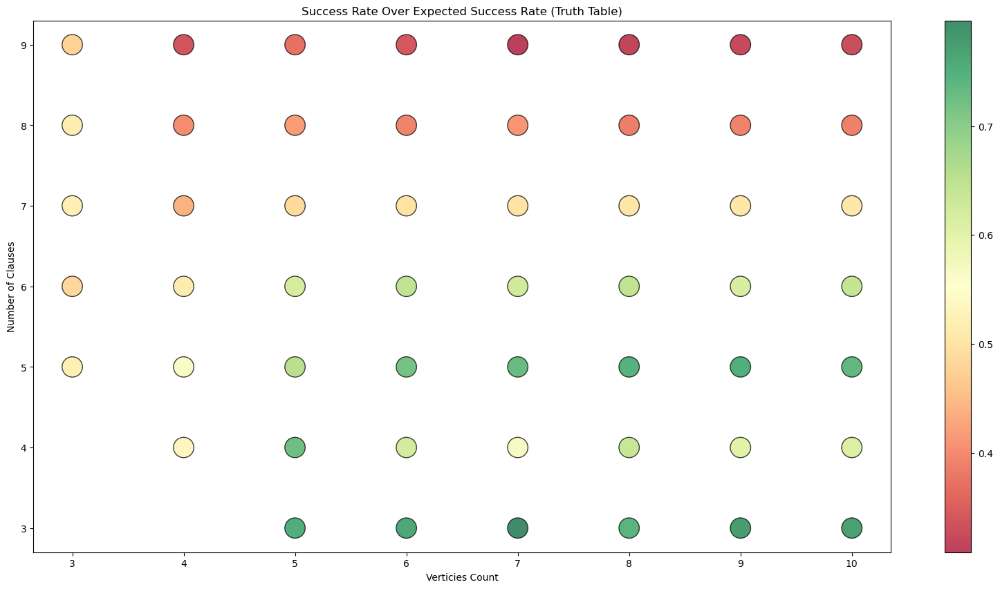

In [23]:
plot_probability_data(n_data, clauses_data, probability_data, "Success Rate Over Expected Success Rate (Truth Table)", filepath="mean_success_rate_over_expected.png")

In [ ]:
n_data, grover_iterations_data, probability_data = get_probability_data(sat_trials_db, CompileType.XAG)
plot_probability_data(n_data, grover_iterations_data, probability_data, "Success Rate Over Expected Success Rate (XAG)", filepath="mean_success_rate_over_expected.png")

In [32]:
trial = sat_trials_db.get(trial_id=1443)[0]
trial.sat_instance.print_summary()
print(f"{len(trial.sat_instance.solutions)} solutions: {trial.sat_instance.solutions}", )

--- 3SAT Instance Summary ---
Database ID (sat_id):     5728
Generation Seed:          254871164
Number of Variables:      6
Number of Clauses:        9
Expression:               (x3 V x6 V ~x5) ^ (x2 V ~x3 V x6) ^ (x3 V ~x4 V ~x6) ^ (~x3 V ~x4 V ~x5) ^ (~x2 V ~x3 V ~x6) ^ (~x6 V ~x1 V x3) ^ (~x1 V ~x2 V x5) ^ (~x2 V ~x4 V ~x6) ^ (~x6 V ~x5 V x2)

--- Solution Information ---
Status:                   Solutions computed.
Number Found:             17
Percentage Solutions:     26.5625% (17/64)
Optimal Grover Iterations: 1
-----------------------------
17 solutions: [[-1, -2, -3, -4, -5, -6], [-1, 2, -3, -4, -5, -6], [-1, 2, 3, -4, -5, -6], [-1, 2, 3, 4, -5, -6], [1, -2, 3, 4, -5, 6], [1, -2, -3, 4, -5, -6], [1, -2, 3, -4, -5, 6], [-1, -2, 3, -4, -5, 6], [-1, -2, -3, -4, -5, 6], [-1, 2, -3, -4, -5, 6], [-1, -2, -3, 4, -5, -6], [-1, 2, -3, 4, -5, -6], [1, -2, -3, -4, -5, -6], [1, 2, 3, -4, 5, -6], [-1, 2, -3, -4, 5, 6], [-1, 2, 3, -4, 5, -6], [-1, -2, 3, 4, -5, 6]]


In [33]:
import matplotlib.pyplot as plt
import numpy as np

def simple_visualize_results(results_dict, title="Quantum Measurement Results"):
    """
    A simple visualization for quantum measurement results.
    
    Parameters:
    -----------
    results_dict : dict
        Dictionary with quantum states as keys and counts as values
    title : str, optional
        Title for the visualization
    """
    # Basic calculations
    total_samples = sum(results_dict.values())
    n_qubits = len(list(results_dict.keys())[0])
    
    # Sort results by count (descending)
    sorted_results = dict(sorted(results_dict.items(), key=lambda x: x[1], reverse=True))
    
    # Create figure with two subplots
    fig, ax1 = plt.subplots(figsize=(14, 6))
    
    # 1. Bar chart of states
    bars = ax1.bar(range(len(sorted_results)), sorted_results.values(), color='skyblue')
    
    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{int(height)}', ha='center', va='bottom', fontsize=8)
    
    # Set the x-tick positions and labels
    ax1.set_xticks(range(len(sorted_results)))
    ax1.set_xticklabels(list(sorted_results.keys()), rotation=70, fontsize=9)
    
    # Add uniform expectation line
    expected_uniform = total_samples / len(results_dict)
    ax1.axhline(y=expected_uniform, color='red', linestyle='--', 
                label=f'Expected Uniform: {expected_uniform:.1f}')
    
    ax1.set_title('Measurement Counts')
    ax1.set_xlabel('State')
    ax1.set_ylabel('Count')
    ax1.legend()
   
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Print simple statistics
    print(f"Total samples: {total_samples}")
    print(f"Highest state: {list(sorted_results.keys())[0]} ({list(sorted_results.values())[0]} counts, {list(sorted_results.values())[0]/total_samples*100:.2f}%)")
    print(f"Lowest state: {list(sorted_results.keys())[-1]} ({list(sorted_results.values())[-1]} counts, {list(sorted_results.values())[-1]/total_samples*100:.2f}%)")
    
    # Check for clear winner (probability > 20%)
    top_prob = list(sorted_results.values())[0] / total_samples
    if top_prob > 0.2:
        print(f"✓ Strong signal detected in state {list(sorted_results.keys())[0]} ({top_prob*100:.1f}%)")
    else:
        print(f"⚠ No clear winner detected. Top state has only {top_prob*100:.1f}% probability")
    
    # Check for uniformity
    uniformity_threshold = 0.05  # 5% variation
    max_variation = max(abs(count/total_samples - 1/len(results_dict)) for count in results_dict.values())
    
    if max_variation < uniformity_threshold:
        print(f"⚠ Distribution appears close to uniform (max variation: {max_variation*100:.1f}%)")
    
    # Return a simple summary for programmatic use
    return {
        "total_samples": total_samples,
        "top_state": list(sorted_results.keys())[0],
        "top_probability": top_prob,
    }

#hw_counts = job.result()[0].data.c.get_counts()
#print(hw_counts)


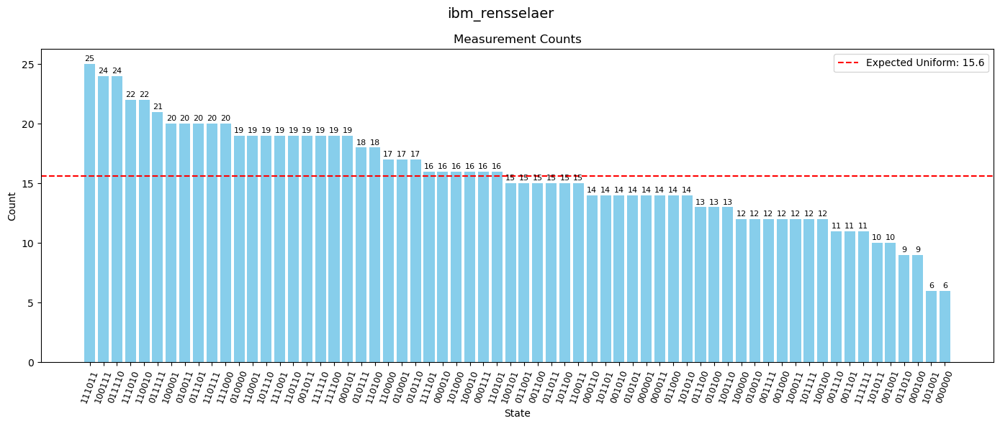

Total samples: 1000
Highest state: 111011 (25 counts, 2.50%)
Lowest state: 000000 (6 counts, 0.60%)
⚠ No clear winner detected. Top state has only 2.5% probability
⚠ Distribution appears close to uniform (max variation: 1.0%)


{'total_samples': 1000, 'top_state': '111011', 'top_probability': 0.025}

In [34]:
simple_visualize_results(trial.counts, "ibm_rensselaer")

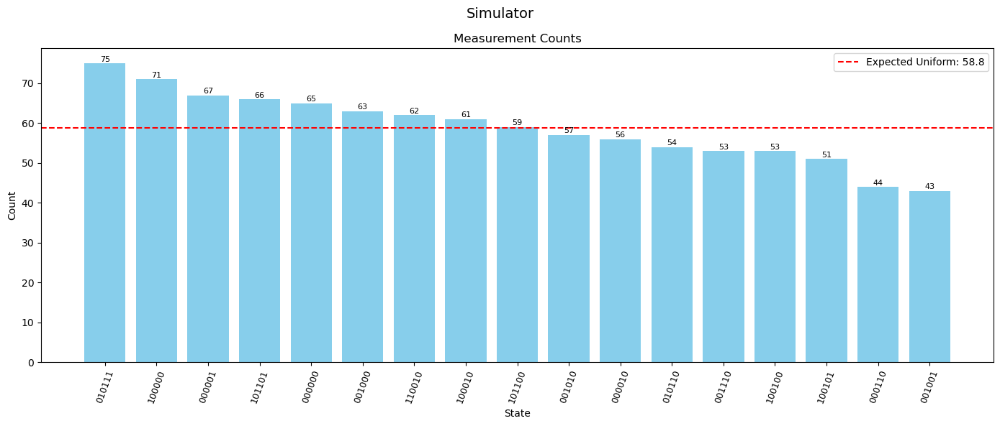

Total samples: 1000
Highest state: 010111 (75 counts, 7.50%)
Lowest state: 001001 (43 counts, 4.30%)
⚠ No clear winner detected. Top state has only 7.5% probability
⚠ Distribution appears close to uniform (max variation: 1.6%)


{'total_samples': 1000, 'top_state': '010111', 'top_probability': 0.075}

In [35]:
simple_visualize_results(trial.simulation_counts, "Simulator")